Open and image using opencv

In [189]:
import cv2 as cv
from matplotlib import pyplot as plt
image_file = "data/flip2.png"
img = cv.imread(image_file)


In [190]:
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)
    if len(im_data.shape) == 2:  # Grayscale
        height, width = im_data.shape
    else:  # RGB
        height, width, _ = im_data.shape

    # What size does the figure need to be in inches to fit the image 
    figsize = width / float(dpi) , height /float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure 
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0,0,1,1])

    # Hide spines ,ticks etc
    ax.axis('off')

    # Display the image 
    ax.imshow(im_data , cmap = 'gray')
    plt.imshow(im_data, cmap='gray' if len(im_data.shape) == 2 else None)
    plt.show()

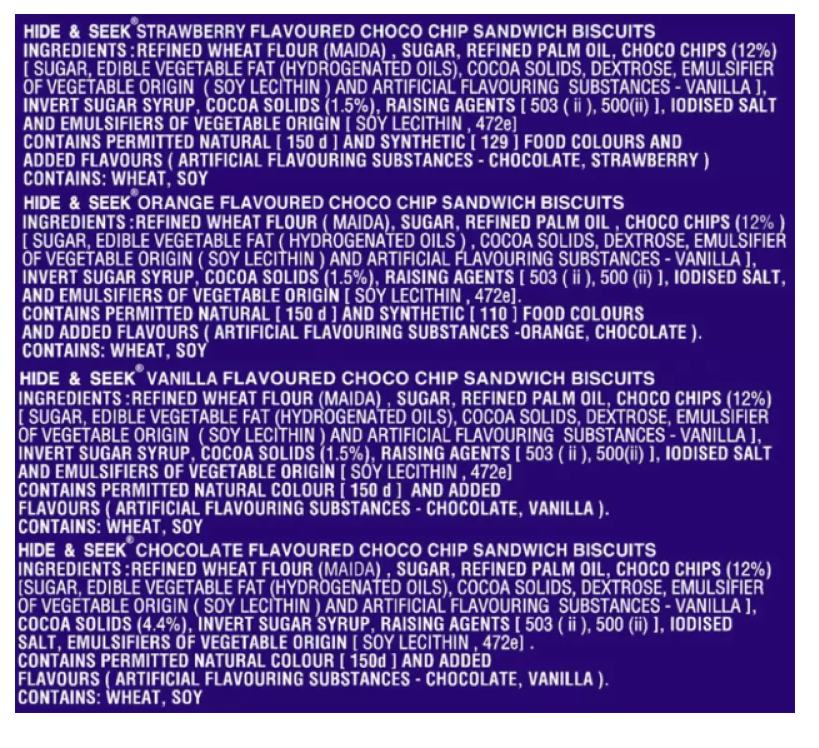

In [191]:
display(image_file)

Inverted images

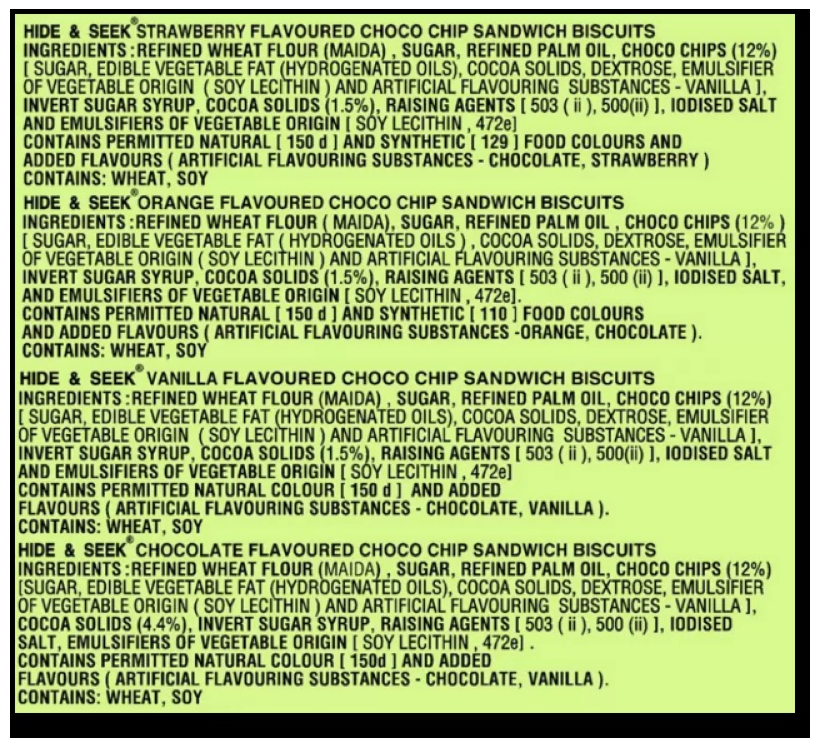

In [192]:
inverted_image = cv.bitwise_not(img)
cv.imwrite("temp/inverted.jpg",inverted_image)
display("temp/inverted.jpg")

Rescaling

Binarization

In [193]:
def grayscale(image):
    return cv.cvtColor(image,cv.COLOR_BGR2GRAY)


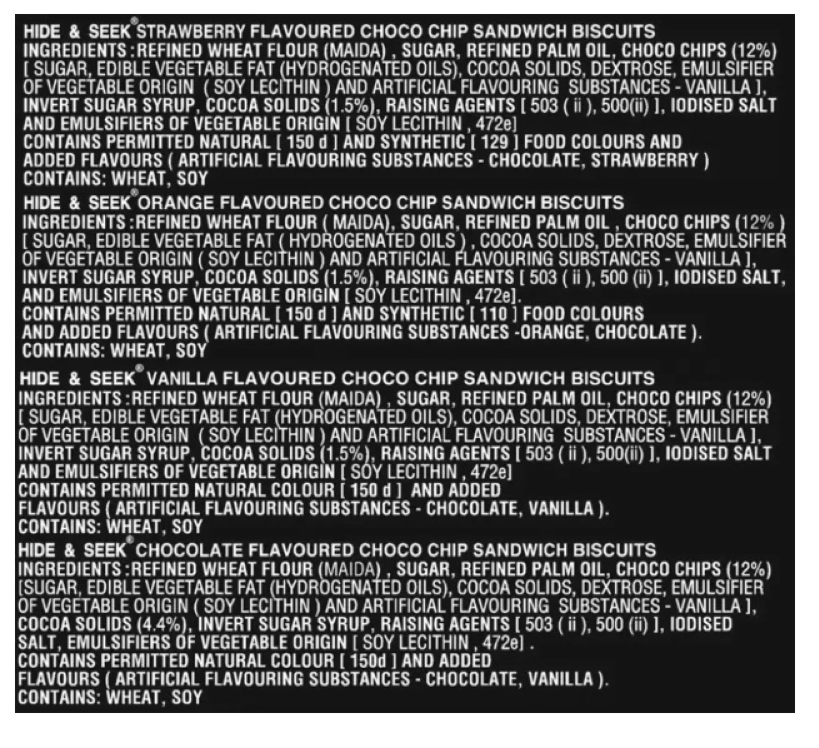

In [194]:
gray_img = grayscale(img)
cv.imwrite("temp/gray.jpg" , gray_img)
display("temp/gray.jpg")

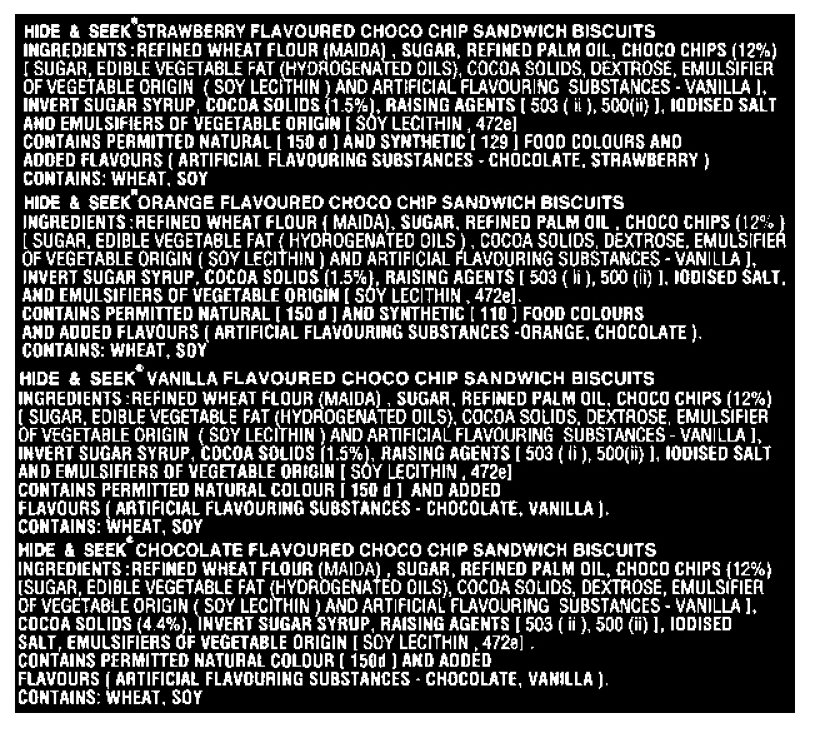

In [195]:
thresh ,im_bw = cv.threshold(gray_img,120,255,cv.THRESH_BINARY)
cv.imwrite("temp/bw_img.jpg",im_bw)
display("temp/bw_img.jpg")

Noise Removal 

In [196]:
def noise_removal(image):
    import numpy as np 
    kernel = np.ones((1,1),np.uint8)
    image =cv.dilate(image, kernel,iterations=1)
    kernel = np.ones((1,1),np.uint8)
    image = cv.erode(image,kernel,iterations=1)
    image = cv.morphologyEx(image,cv.MORPH_CLOSE,kernel)
    image = cv.medianBlur(image,3)
    return (image)


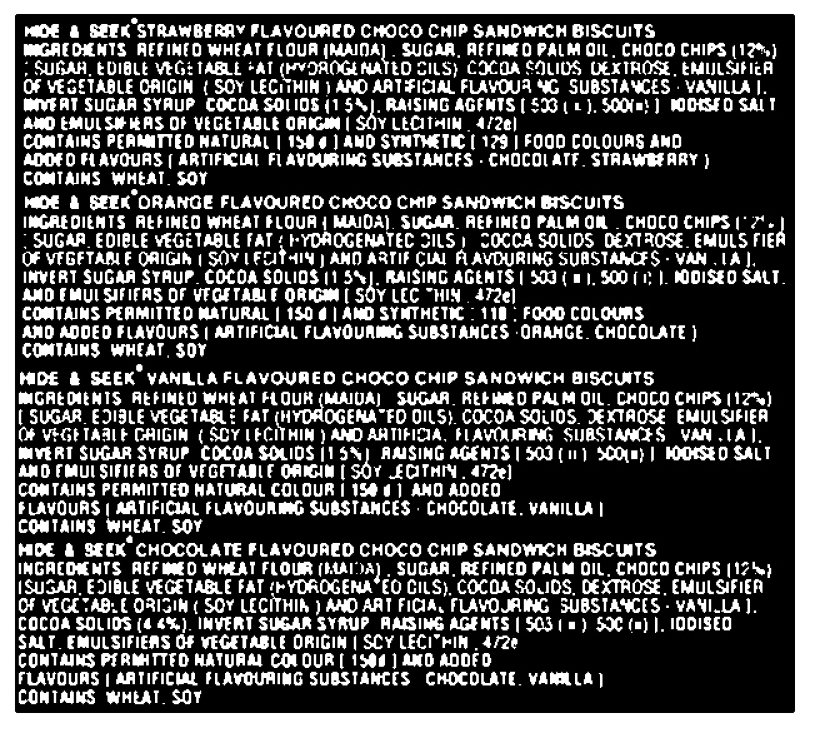

In [197]:
no_noise = noise_removal(im_bw)
cv.imwrite("temp/no_noise.jpg",no_noise)
display("temp/no_noise.jpg")

Dialation and Erosion

In [198]:
def thin(image):
    import numpy as np
    image = cv.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv.erode(image,kernel,iterations=1)
    image = cv.bitwise_not(image)
    return(image)
    

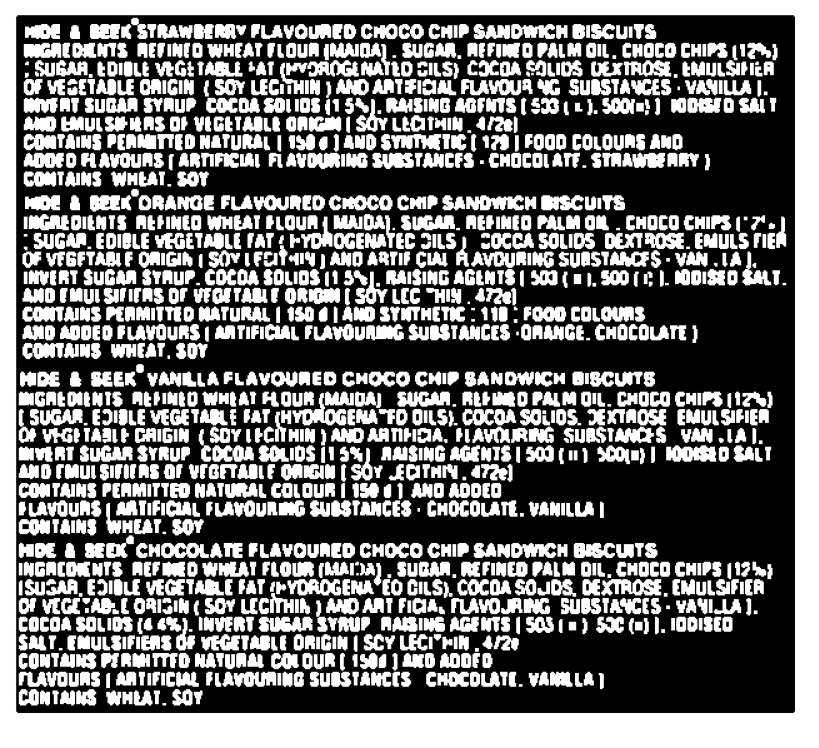

In [199]:
eroded_img = thin(no_noise)
cv.imwrite("temp/eroded.jpg" , eroded_img)
display("temp/eroded.jpg")

In [200]:
def thick(image):
    import numpy as np
    image = cv.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv.dilate(image,kernel,iterations=1)
    image = cv.bitwise_not(image)
    return(image)

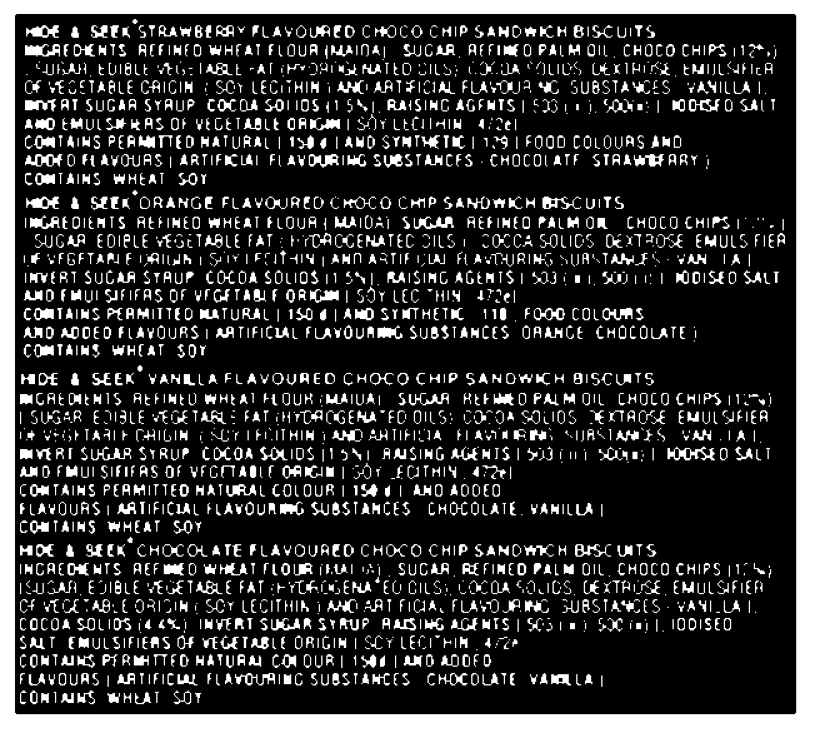

In [201]:
dialated_img = thick(no_noise)
cv.imwrite("temp/dialated.jpg" ,dialated_img)
display("temp/dialated.jpg")

Rotation / Deskewing 

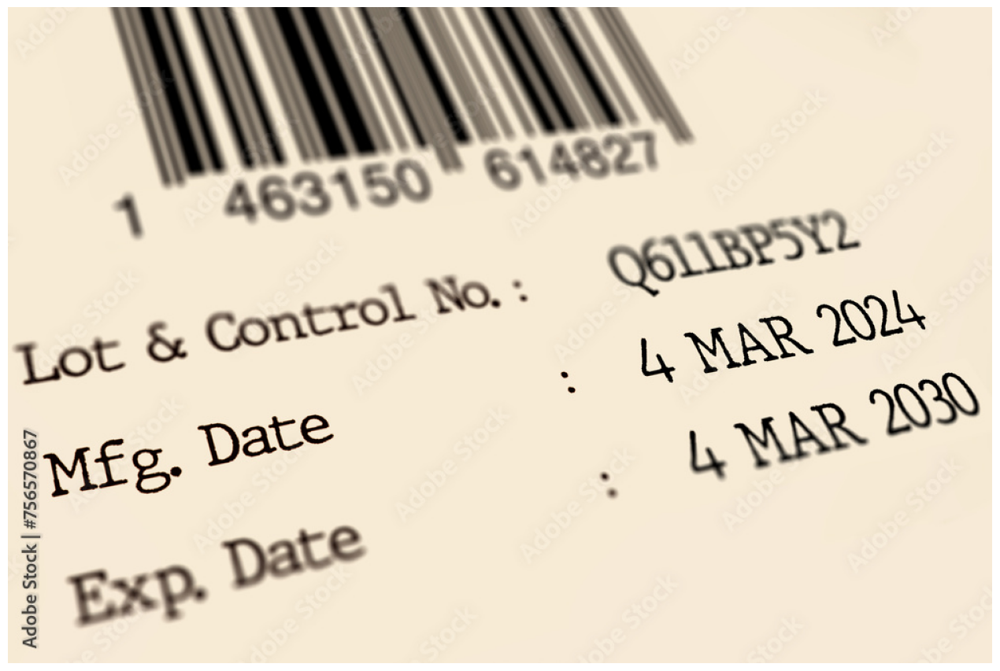

In [202]:
new = image_file
display("data/exxp.jpg")
box = cv.imread("temp/boxes.jpg")


In [203]:
#https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
import numpy as np

def getSkewAngle(cvImage) -> float:
    # Convert to grayscale
    gray = cv.cvtColor(cvImage, cv.COLOR_BGR2GRAY)
    # Apply Gaussian blur
    blur = cv.GaussianBlur(gray, (9, 9), 0)
    # Apply thresholding
    thresh = cv.threshold(blur, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)[1]

    # Dilation to merge characters into lines
    kernel = cv.getStructuringElement(cv.MORPH_RECT, (30, 5))
    dilate = cv.dilate(thresh, kernel, iterations=2)

    # Find contours
    contours, _ = cv.findContours(dilate, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv.contourArea, reverse=True)

    # Check if contours were found
    if len(contours) == 0:
        return 0.0  # No contours found, return 0 degree

    # Find the largest contour and get the minimum area rectangle
    largestContour = contours[0]
    minAreaRect = cv.minAreaRect(largestContour)
    angle = minAreaRect[-1]

    # Adjust angle to get the correct skew angle
    if angle < -45:
        angle = 90 + angle

    return -1.0 * angle  # Return negative angle to correct the skew

def rotateImage(cvImage, angle: float):
    (h, w) = cvImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv.warpAffine(cvImage, M, (w, h), flags=cv.INTER_CUBIC, borderMode=cv.BORDER_REPLICATE)
    return newImage

In [204]:
# Deskew the image 
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage ,-1.0 * angle)

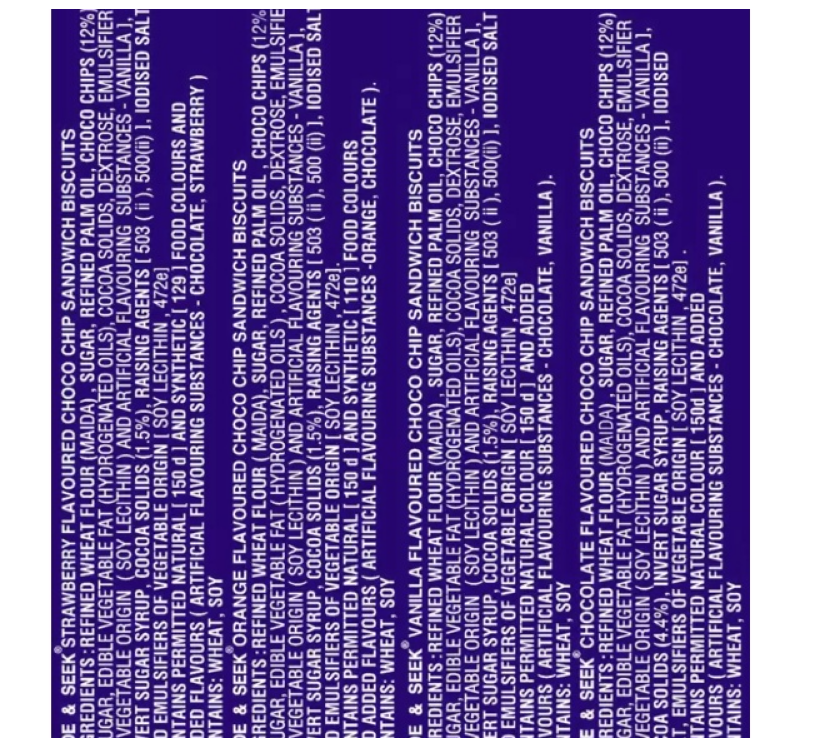

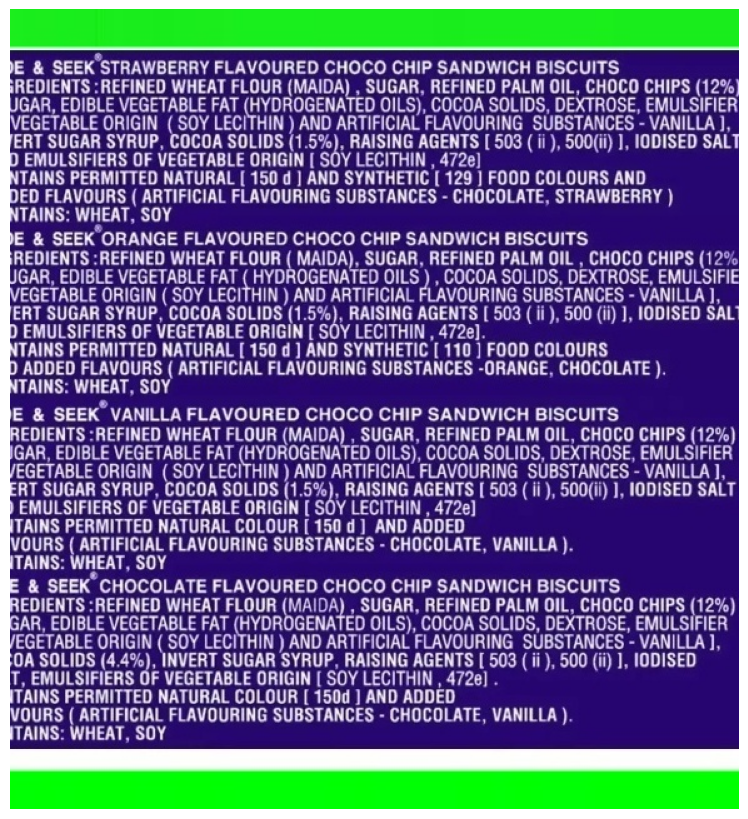

In [205]:
fixed = deskew(img)
cv.imwrite("temp/rotated.jpg",fixed)
display("temp/rotated.jpg")
box_new = deskew(box)
cv.imwrite("temp/r_box.jpg",box_new)
display("temp/r_box.jpg")

Removing borders

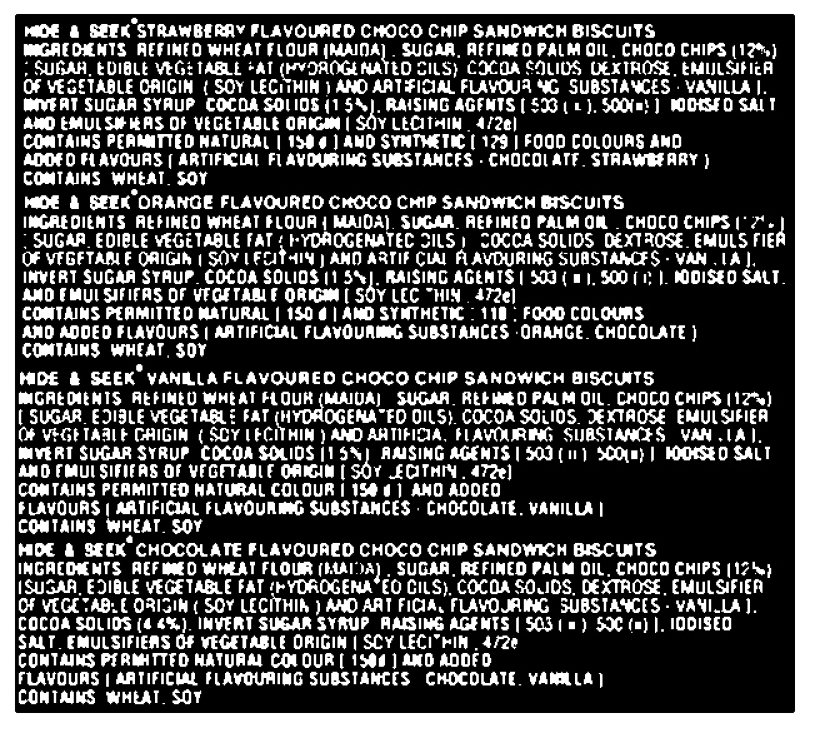

In [206]:
display("temp/no_noise.jpg")

In [207]:
def remove_border(Image):
    contours ,heirarchy = cv.findContours(Image,cv.RETR_EXTERNAL,cv.CHAIN_APPROX_SIMPLE)
    cntSorted = sorted(contours,key=lambda x:cv.contourArea(x))
    cnt = cntSorted[-1]
    x,y,w,h = cv.boundingRect(cnt)
    crop = Image[y:y+h , x:x+w]
    return(crop)


In [ ]:
no_border = remove_border(no_noise)
cv.imwrite("temp/no_border.jpg",no_border)
display("temp/no_border.jpg")

Missing border 

In [184]:
color = [0,255,255]
top,bottom,left,right = [30]*4


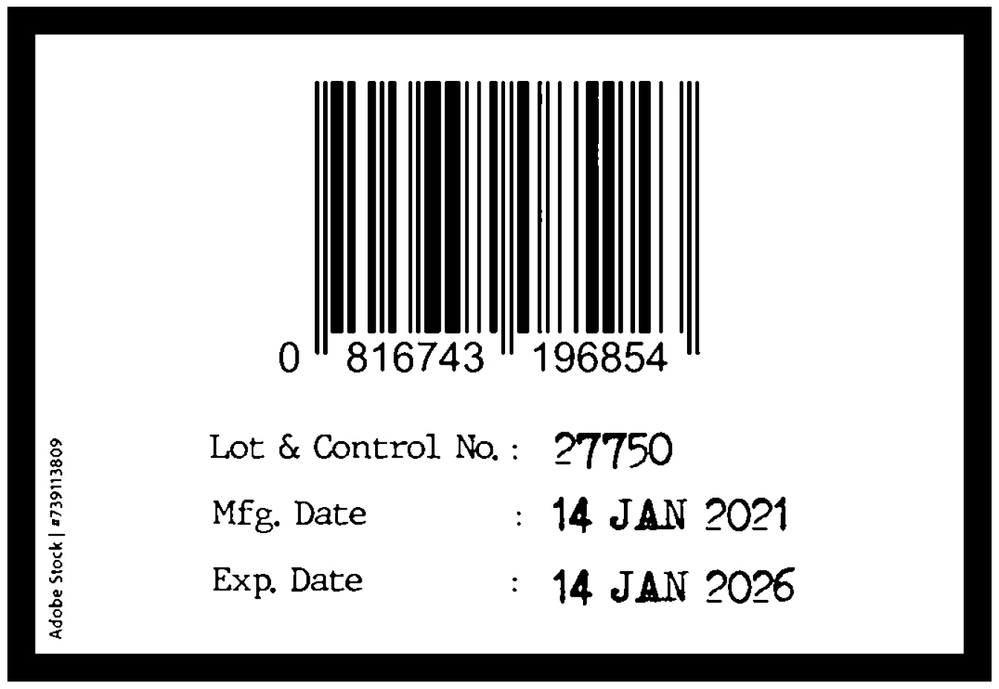

In [185]:
image_with_border = cv.copyMakeBorder(no_border,top,bottom,left,right,cv.BORDER_CONSTANT,value=color)
cv.imwrite("temp/with_border.jpg",image_with_border)
display("temp/with_border.jpg")

Transparency / Alpha channel 